In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import date, datetime, timedelta

In [2]:
df_gbg = pd.read_pickle('../Dataframes/df_daily_temp_gbg.pkl')

In [3]:
df_gbg.dtypes

Datum             datetime64[ns]
Kvalitet                  object
Snittemperatur           float64
Year                       int32
Month                      int32
dtype: object

In [4]:
df_save = pd.read_pickle('../Dataframes/df_daily_temp_save.pkl')

In [5]:
df_save.dtypes

Datum             datetime64[ns]
Kvalitet                  object
Snittemperatur           float64
Year                       int32
Month                      int32
dtype: object

In [6]:
# Add quarter column to df_gbg
df_gbg['Quarter'] = 0
for ind, val in df_gbg.iterrows():
    month = val['Month']
    if 1 <= month <=3:
        df_gbg['Quarter'][ind] = 1
        pass
    elif 4 <= month <= 6:
        df_gbg['Quarter'][ind] = 2
        pass
    elif 7 <= month <= 9:
        df_gbg['Quarter'][ind] = 3
        pass
    else:
        df_gbg['Quarter'][ind] = 4

C:\Users\olofs\AppData\Local\Temp\ipykernel_28180\4016858455.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gbg['Quarter'][ind] = 1
C:\Users\olofs\AppData\Local\Temp\ipykernel_28180\4016858455.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gbg['Quarter'][ind] = 1
C:\Users\olofs\AppData\Local\Temp\ipykernel_28180\4016858455.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gbg['Quarter'][ind] = 1
C:\Users\olofs\AppD

In [7]:
# Add quarter column to df_save
df_save['Quarter'] = 0
for ind, val in df_save.iterrows():
    month = val['Month']
    if 1 <= month <=3:
        df_save['Quarter'][ind] = 1
        pass
    elif 4 <= month <= 6:
        df_save['Quarter'][ind] = 2
        pass
    elif 7 <= month <= 9:
        df_save['Quarter'][ind] = 3
        pass
    else:
        df_save['Quarter'][ind] = 4

C:\Users\olofs\AppData\Local\Temp\ipykernel_28180\2836094441.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_save['Quarter'][ind] = 1
C:\Users\olofs\AppData\Local\Temp\ipykernel_28180\2836094441.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_save['Quarter'][ind] = 1
C:\Users\olofs\AppData\Local\Temp\ipykernel_28180\2836094441.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_save['Quarter'][ind] = 1
C:\Users\olofs\A

In [8]:
# Filter for just the overlaping time
# df_save = df_save.where(df_save['Datum'].dt.year > 1960).dropna()

In [9]:
df_merged_temp_com = pd.merge(df_gbg, df_save[['Datum', 'Snittemperatur']], on='Datum', suffixes=('_GBG', '_save'))

In [10]:
df_merged_temp_com['Diff'] = df_merged_temp_com['Snittemperatur_GBG'] - df_merged_temp_com['Snittemperatur_save'].round(2)

In [11]:
# Diff shows how much warmer GBG was than Säve. If negative, GBG was colder
df_merged_temp_com

,Datum,Kvalitet,Snittemperatur_GBG,Year,Month,Quarter,Snittemperatur_save,Diff
0,1961-01-01,G,1.07,1961,1,1,0.36,0.71
1,1961-01-02,G,2.27,1961,1,1,1.64,0.63
2,1961-01-03,G,2.27,1961,1,1,1.57,0.70
3,1961-01-04,G,2.53,1961,1,1,1.38,1.15
4,1961-01-05,G,2.13,1961,1,1,1.17,0.96
...,...,...,...,...,...,...,...,...
13887,2006-12-01,Y,8.35,2006,12,4,8.03,0.32
13888,2006-12-02,Y,9.10,2006,12,4,8.81,0.29
13889,2006-12-03,Y,8.50,2006,12,4,8.11,0.39
13890,2006-12-04,Y,8.99,2006,12,4,8.57,0.42


In [12]:
avg_diff = df_merged_temp_com['Diff'].mean()
avg_diff

0.8849964008062193

In [13]:
temp_per_month = df_merged_temp_com['Diff'].groupby(df_merged_temp_com['Month']).mean()

In [14]:
temp_per_month.round(2).value_counts().unique

<bound method Series.unique of Diff
0.67    2
1.16    2
0.76    1
0.86    1
0.96    1
1.14    1
1.06    1
0.82    1
0.70    1
0.66    1
Name: count, dtype: int64>

In [15]:
for i in temp_per_month:
    print(i)

0.671044142614601
0.7560800744878957
0.8561564059900165
0.9557046413502109
1.1617238346525944
1.1613153153153153
1.1377303754266213
1.0625963149078728
0.8185128205128205
0.7010101867572156
0.6641228070175439
0.6749913194444445


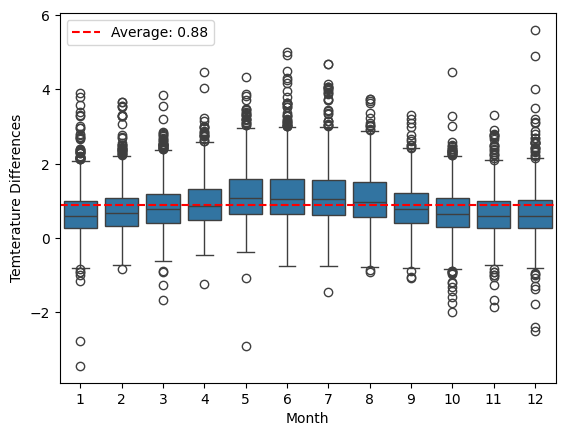

In [16]:
plt.figure()
graph = sns.boxplot(df_merged_temp_com, x=df_merged_temp_com['Month'], y=df_merged_temp_com['Diff'])
graph.axhline(avg_diff, color='r', linestyle='--', label=f'Average: {avg_diff.round(2)}')
graph.legend()
plt.ylabel('Temterature Differences')
plt.show()

In [17]:
df_merged_temp_com

,Datum,Kvalitet,Snittemperatur_GBG,Year,Month,Quarter,Snittemperatur_save,Diff
0,1961-01-01,G,1.07,1961,1,1,0.36,0.71
1,1961-01-02,G,2.27,1961,1,1,1.64,0.63
2,1961-01-03,G,2.27,1961,1,1,1.57,0.70
3,1961-01-04,G,2.53,1961,1,1,1.38,1.15
4,1961-01-05,G,2.13,1961,1,1,1.17,0.96
...,...,...,...,...,...,...,...,...
13887,2006-12-01,Y,8.35,2006,12,4,8.03,0.32
13888,2006-12-02,Y,9.10,2006,12,4,8.81,0.29
13889,2006-12-03,Y,8.50,2006,12,4,8.11,0.39
13890,2006-12-04,Y,8.99,2006,12,4,8.57,0.42


In [18]:
df_merged_temp_com['Monthly_diff'] = 0
for ind, val in df_merged_temp_com.iterrows():
    month_no = val['Month']
    df_merged_temp_com['Monthly_diff'][ind] = temp_per_month[month_no].round(2)



C:\Users\olofs\AppData\Local\Temp\ipykernel_28180\3339614065.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_merged_temp_com['Monthly_diff'][ind] = temp_per_month[month_no].round(2)
C:\Users\olofs\AppData\Local\Temp\ipykernel_28180\3339614065.py:4: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '0.67' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df_merged_temp_com['Monthly_diff'][ind] = temp_per_month[month_no].round(2)


In [19]:
df_merged_temp_com['Monthly_diff'].value_counts()

Monthly_diff
0.67    2330
1.16    2247
0.86    1202
1.06    1194
0.96    1185
0.70    1178
1.14    1172
0.82    1170
0.66    1140
0.76    1074
Name: count, dtype: int64

In [20]:
df_merged_temp_com[110:130]

,Datum,Kvalitet,Snittemperatur_GBG,Year,Month,Quarter,Snittemperatur_save,Diff,Monthly_diff
110,1961-04-21,G,9.87,1961,4,2,8.69,1.18,0.96
111,1961-04-22,G,13.53,1961,4,2,12.36,1.17,0.96
112,1961-04-23,G,16.93,1961,4,2,15.71,1.22,0.96
113,1961-04-24,G,16.73,1961,4,2,15.44,1.29,0.96
114,1961-04-25,G,15.07,1961,4,2,13.75,1.32,0.96
115,1961-04-26,G,15.40,1961,4,2,14.64,0.76,0.96
116,1961-04-27,G,16.93,1961,4,2,15.12,1.81,0.96
117,1961-04-28,G,13.57,1961,4,2,11.69,1.88,0.96
118,1961-04-29,G,8.93,1961,4,2,7.84,1.09,0.96
119,1961-04-30,G,10.47,1961,4,2,10.15,0.32,0.96


We now have the average monthly temp differences


In [21]:
df_all_temps = pd.read_pickle('../Dataframes/df_compiled_daily_temp_gbg_save.pkl')

In [22]:
df_all_temps

,Datum,Kvalitet,Snittemperatur,Year,Month
0,1944-01-01,G,3.20,1944,1
1,1944-01-02,G,3.60,1944,1
2,1944-01-03,G,2.80,1944,1
3,1944-01-04,G,-4.47,1944,1
4,1944-01-05,G,-1.40,1944,1
...,...,...,...,...,...
19909,2023-06-27,G,18.18,2023,6
19910,2023-06-28,G,19.72,2023,6
19911,2023-06-29,G,19.22,2023,6
19912,2023-06-30,G,17.40,2023,6


In [23]:
# df_all_temps['Month'] = df_all_temps['Datum'].dt.month
# df_all_temps = df_all_temps.drop(columns=['Year'])
# df_all_temps['Year'] = df_all_temps['Datum'].dt.year


In [24]:
df_all_temps

,Datum,Kvalitet,Snittemperatur,Year,Month
0,1944-01-01,G,3.20,1944,1
1,1944-01-02,G,3.60,1944,1
2,1944-01-03,G,2.80,1944,1
3,1944-01-04,G,-4.47,1944,1
4,1944-01-05,G,-1.40,1944,1
...,...,...,...,...,...
19909,2023-06-27,G,18.18,2023,6
19910,2023-06-28,G,19.72,2023,6
19911,2023-06-29,G,19.22,2023,6
19912,2023-06-30,G,17.40,2023,6


In [25]:
# for ind, val in df_all_temps.iterrows():
#     month = val['Month']
#     # print(df_all_temps['Snittemperatur'])
#     # print(temp_per_month[month])
#     new_temp = df_all_temps['Snittemperatur'] + temp_per_month[month]
#     print(new_temp)
#     break

In [26]:
df_all_temps_augmented = df_all_temps

In [27]:
date_to_start = pd.to_datetime('2006-12-06')
for ind, val in df_all_temps_augmented.iterrows():
    if val['Datum'] > date_to_start:
        month = val['Month']
        new_temp = val['Snittemperatur'] - temp_per_month[month]
        df_all_temps_augmented['Snittemperatur'][ind] = new_temp
    else:
        pass


C:\Users\olofs\AppData\Local\Temp\ipykernel_28180\4112968676.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all_temps_augmented['Snittemperatur'][ind] = new_temp
C:\Users\olofs\AppData\Local\Temp\ipykernel_28180\4112968676.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all_temps_augmented['Snittemperatur'][ind] = new_temp
C:\Users\olofs\AppData\Local\Temp\ipykernel_28180\4112968676.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ve

In [28]:
df_all_temps_augmented

,Datum,Kvalitet,Snittemperatur,Year,Month
0,1944-01-01,G,3.200000,1944,1
1,1944-01-02,G,3.600000,1944,1
2,1944-01-03,G,2.800000,1944,1
3,1944-01-04,G,-4.470000,1944,1
4,1944-01-05,G,-1.400000,1944,1
...,...,...,...,...,...
19909,2023-06-27,G,17.018685,2023,6
19910,2023-06-28,G,18.558685,2023,6
19911,2023-06-29,G,18.058685,2023,6
19912,2023-06-30,G,16.238685,2023,6


In [29]:
df_all_temps

,Datum,Kvalitet,Snittemperatur,Year,Month
0,1944-01-01,G,3.200000,1944,1
1,1944-01-02,G,3.600000,1944,1
2,1944-01-03,G,2.800000,1944,1
3,1944-01-04,G,-4.470000,1944,1
4,1944-01-05,G,-1.400000,1944,1
...,...,...,...,...,...
19909,2023-06-27,G,17.018685,2023,6
19910,2023-06-28,G,18.558685,2023,6
19911,2023-06-29,G,18.058685,2023,6
19912,2023-06-30,G,16.238685,2023,6


In [30]:
df_all_temps_augmented['Snittemperatur'] = df_all_temps_augmented['Snittemperatur'].round(2)

In [31]:
df_all_temps_augmented

,Datum,Kvalitet,Snittemperatur,Year,Month
0,1944-01-01,G,3.20,1944,1
1,1944-01-02,G,3.60,1944,1
2,1944-01-03,G,2.80,1944,1
3,1944-01-04,G,-4.47,1944,1
4,1944-01-05,G,-1.40,1944,1
...,...,...,...,...,...
19909,2023-06-27,G,17.02,2023,6
19910,2023-06-28,G,18.56,2023,6
19911,2023-06-29,G,18.06,2023,6
19912,2023-06-30,G,16.24,2023,6


In [32]:
df_all_temps_augmented['Day_of_year'] = df_all_temps_augmented['Datum'].dt.day_of_year

In [33]:
df_all_temps_augmented

,Datum,Kvalitet,Snittemperatur,Year,Month,Day_of_year
0,1944-01-01,G,3.20,1944,1,1
1,1944-01-02,G,3.60,1944,1,2
2,1944-01-03,G,2.80,1944,1,3
3,1944-01-04,G,-4.47,1944,1,4
4,1944-01-05,G,-1.40,1944,1,5
...,...,...,...,...,...,...
19909,2023-06-27,G,17.02,2023,6,178
19910,2023-06-28,G,18.56,2023,6,179
19911,2023-06-29,G,18.06,2023,6,180
19912,2023-06-30,G,16.24,2023,6,181


In [34]:
counter = 0
df_all_temps_augmented['Over_10_5_days_in_a_row'] = 0


In [35]:
df_all_temps_augmented[140:160]

,Datum,Kvalitet,Snittemperatur,Year,Month,Day_of_year,Over_10_5_days_in_a_row
140,1944-05-20,G,8.13,1944,5,141,0
141,1944-05-21,G,9.60,1944,5,142,0
142,1944-05-22,G,7.60,1944,5,143,0
143,1944-05-23,G,9.27,1944,5,144,0
144,1944-05-24,G,9.40,1944,5,145,0
145,1944-05-25,G,8.47,1944,5,146,0
146,1944-05-26,G,11.07,1944,5,147,0
147,1944-05-27,G,12.40,1944,5,148,0
148,1944-05-28,G,15.20,1944,5,149,0
149,1944-05-29,G,18.10,1944,5,150,0


In [36]:
for i in range(1, len(df_all_temps_augmented)):
    if df_all_temps_augmented['Snittemperatur'].iloc[i] >= 10:
        counter += 1
    else:
        counter = 0
        pass
    if counter == 5:
        df_all_temps_augmented['Over_10_5_days_in_a_row'].iloc[i] = 1
        counter = 0
    else:
        pass


C:\Users\olofs\AppData\Local\Temp\ipykernel_28180\1725109229.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all_temps_augmented['Over_10_5_days_in_a_row'].iloc[i] = 1
C:\Users\olofs\AppData\Local\Temp\ipykernel_28180\1725109229.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all_temps_augmented['Over_10_5_days_in_a_row'].iloc[i] = 1
C:\Users\olofs\AppData\Local\Temp\ipykernel_28180\1725109229.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning

In [37]:
# df_all_temps_augmented.to_pickle('../Dataframes/daily_temp_gbg_save_adjusted.pkl')
# df_all_temps_augmented.to_csv('../data/prepared_data/daily_temp_gbg_save_adjusted.csv', index=False, mode='w')

In [38]:
df_all_temps_augmented['Year'].value_counts()

Year
1944    366
1960    366
2020    366
2016    366
2012    366
       ... 
1954    365
1989    365
1990    365
2013    335
2023    182
Name: count, Length: 80, dtype: int64

In [1]:
def get_first_summer_day_per_year(year):
    for ind, val in df_all_temps_augmented[df_all_temps_augmented['Year'] == year].iterrows():
        if df_all_temps_augmented['Over_10_5_days_in_a_row'][ind] == 1:
            first_summer_day = df_all_temps_augmented['Datum'][ind-4]
            return first_summer_day
            break
        else:
            pass
    return None

In [40]:
for ind, val in df_all_temps_augmented[df_all_temps_augmented['Year'] == 2023].iterrows():
        if val['Over_10_5_days_in_a_row'] == 1:
                first_summer_day = df_all_temps_augmented['Datum'][ind-4]
                print(first_summer_day)
                break
        else:
                pass

19859   1998-05-16
19859   2023-05-08
Name: Datum, dtype: datetime64[ns]


In [129]:
get_first_summer_day_per_year(2018)


ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [42]:
summer_days = []
for i in range(1944, 2023):
    summer = pd.to_datetime(get_first_summer_day_per_year(i))
    summer_days.append(summer)


summer_days_non_augmented = []
for i in range(1944, 2023):
    summer = pd.to_datetime(get_first_summer_day_per_year_non_augmented(i))
    summer_days_non_augmented.append(summer)

In [43]:
summer_days_non_augmented[1]

Timestamp('1945-05-11 00:00:00')

In [44]:
years = []

for x, i in enumerate(summer_days):
    string = str(i.year)
    years.append(string)

months = []

for x, i in enumerate(summer_days):
    string = str(i.month)
    months.append(string)

days= []
for x, i in enumerate(summer_days):
    string = str(i.day)
    if len(string) < 2:
        string = f'0{string}'
    days.append(string)



years_non_augmented = []

for x, i in enumerate(summer_days_non_augmented):
    string = str(i.year)
    years_non_augmented.append(string)

months_non_augmented = []

for x, i in enumerate(summer_days_non_augmented):
    string = str(i.month)
    months_non_augmented.append(string)

days_non_augmented = []
for x, i in enumerate(summer_days_non_augmented):
    string = str(i.day)
    if len(string) < 2:
        string = f'0{string}'
    days_non_augmented.append(string)

In [45]:
df = pd.DataFrame({'Year': years, 'Month': months, 'Day': days})
df_non_augmented = pd.DataFrame({'Year': years_non_augmented , 'Month': months_non_augmented , 'Day': days_non_augmented })

In [46]:
df_non_augmented

,Year,Month,Day
0,1944,5,26
1,1945,5,11
2,1946,4,26
3,1947,5,04
4,1948,4,17
...,...,...,...
74,2018,5,05
75,2019,4,19
76,2020,5,25
77,2021,5,09


In [47]:
df['Day_of_year'] = f'{df["Month"]}{df["Day"]}'
df_non_augmented['Day_of_year'] = f'{df_non_augmented["Month"]}{df_non_augmented["Day"]}'

In [48]:
for ind, val in df.iterrows():
    mon = df['Month'][ind]
    day = df['Day'][ind]
    monday = str(f'{mon}{day}')
    df['Day_of_year'][ind] = summer_days[ind].day_of_year


for ind, val in df_non_augmented.iterrows():
    mon = df_non_augmented['Month'][ind]
    day = df_non_augmented['Day'][ind]
    monday = str(f'{mon}{day}')
    df_non_augmented['Day_of_year'][ind] = summer_days_non_augmented[ind].day_of_year

In [49]:
df_non_augmented

,Year,Month,Day,Day_of_year
0,1944,5,26,147
1,1945,5,11,131
2,1946,4,26,116
3,1947,5,04,124
4,1948,4,17,108
...,...,...,...,...
74,2018,5,05,125
75,2019,4,19,109
76,2020,5,25,146
77,2021,5,09,129


In [50]:
dates = [int(i) for i in df['Day_of_year']]
years = [int(i) for i in years]


dates_non_augmented = [int(i) for i in df_non_augmented['Day_of_year']]
yearslist_non_augmented = [int(i) for i in years_non_augmented]

In [51]:
first_day = datetime(1944, 1, 1)


iss = first_day+timedelta(days=99)
iss

datetime.datetime(1944, 4, 9, 0, 0)

In [52]:
ticlist = [100, 110, 120, 130, 140, 150, 160]

In [53]:
datelist = []
for i in ticlist:
    datenum = first_day+timedelta(days=i-1)
    month = datenum.strftime('%m')
    day = datenum.strftime('%d')
    datelist.append(f'{month}-{day}')

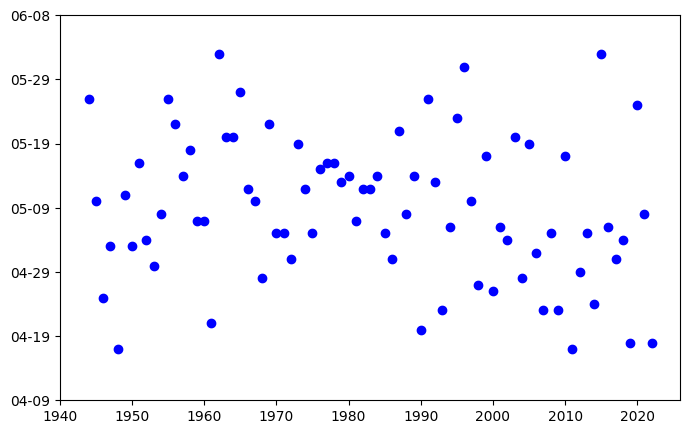

In [54]:


plt.figure(figsize=[8, 5])
sns.scatterplot(x=years, y=dates)
plt.scatter(x=years, y=dates, c='b')
plt.yticks(ticks=ticlist, labels=datelist)
plt.xticks(ticks=[1940, 1950, 1960, 1970, 1980, 1990, 2000, 2010, 2020])
plt.show()

testa med seaborn
